# Funciones utilizadas

In [2]:
import os, shutil, pathlib
import numpy as np
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow import keras 
from tensorflow.keras import layers
import tensorflow as tf
import cv2
import glob
import os
from IPython.display import Image
import pandas as pd
from matplotlib import pyplot as plt

In [3]:
def make_subset(subset_name, start_index, end_index): 
    '''
    Funcion para crear un subdirectorio y copiar un n° de elementos
    en este caso imagenes.
    '''
    for category in ("cat", "gallina", "dog", "horse", "spider"):
        dir = new_base_dir / subset_name / category
        os.makedirs(dir)
        fnames = [f"{category}.{i}.jpg" for i in range(start_index, end_index)]
        for fname in fnames:
            shutil.copyfile(src=original_base / category / fname, dst=dir / fname)
            
            
def export_csv(out_all, targets, path):
    '''
    Función que crea un dataframe, apartir de las salidas obtenidas y los objetivos,
    en seguida exporta un csv con los datos a directorio señalado en la entrada.
    '''    
    names = []
    categories = ['cat', 'dog', 'gallina', 'horse', 'spider']
    for i in range(len(targets)):
        if i<1000 and i>=0:
            names.append('{}.{}.jpg'.format(categories[0], i+1500))
        if i<2000 and i>=1000:
            names.append('{}.{}.jpg'.format(categories[1], i+500))
        if i<3000 and i>=2000:
            names.append('{}.{}.jpg'.format(categories[2], i-500))
        if i<4000 and i>=3000:
            names.append('{}.{}.jpg'.format(categories[3], i-1500))
        if i<5000 and i>=4000:
            names.append('{}.{}.jpg'.format(categories[4], i-2500))
    out = []
    for i in range(5):
        for j in range(1000):
            out.append(out_all[i][j])
    data = {'name_img':names,'Result':out,'Targets':targets }
    df_test = pd.DataFrame(data)
    df_test.to_csv(path, index=False)
    return df_test

def preprocess_image(path,i_w = 180,i_h=180):
    '''
    Esta función preprocesa la imagen de la path con una dimensión por default de 180x180.
    '''
    im2=cv2.imread(path) 
    im2 = im2[:, :, ::-1]
    im2=cv2.resize(im2, (i_w,i_h)) # resize to 180,180 as that is on which model is trained on
    img2 = tf.expand_dims(im2, 0)
    return img2

def get_class(img_pp , model_trained):
    '''
    Función que predice el resultado de la imagen a partir del modelo entrenado proporcionado.
    '''
    predictions = model_trained.predict(img_pp)
    predictions = np.argmax(predictions)
    return predictions

# Clasificacion de animales con 10 clases

## Tratamiento de datos

Crea los 3 subdirectorios de train, validation y test, en caso de contar con ellos no correr esta celda.

In [ ]:
names = ["cat", "gallina", "dog", "horse", "spider"]
for i in range(1,len(names)):
    index = 0
    with os.scandir('C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/raw-img/' + names[i]) as ficheros:
        for fichero in ficheros:
            print(index)
            name = '{}.{}.jpg'.format(names[i],index)
            dir_star = 'C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/raw-img/'
            os.rename(fichero, dir_star + names[i] + '/' + name)
            index +=1
make_subset("train", start_index=0, end_index=1000) 
make_subset("validation", start_index=1000, end_index=1500) 
make_subset("test", start_index=1500, end_index=2500) 

Definimos las rutas de acceso.
Correr esta celda.

In [5]:
#dir_base = 'C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/raw-img'
#original_base = pathlib.Path("raw-img")
new_base_dir = pathlib.Path("dataset_animal")

Preprocesar los datos con image_dataset_from_directory produce lotes de imagenes de los subdirectorios y, junto con las etiquetas que dependera de las clases que haya, en este caso 5 clases. [0,1,2,3,4]

In [6]:
train_dataset = image_dataset_from_directory(
    new_base_dir / 'train',
    image_size=(180,180),
    batch_size=32)

val_dataset = image_dataset_from_directory(
    new_base_dir / 'validation',
    image_size=(180,180),
    batch_size=32)

test_dataset = image_dataset_from_directory(
    new_base_dir / 'test',
    image_size=(180,180),
    batch_size=32)

Found 5000 files belonging to 5 classes.
Found 2500 files belonging to 5 classes.
Found 5000 files belonging to 5 classes.


In [5]:
test_dataset.class_names

['cat', 'dog', 'gallina', 'horse', 'spider']

Creacion del modelo con data augmentation

In [5]:
#Parametros data augmentation
data_augmentation = keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.2)] )

inputs = keras.Input(shape=(180,180,3))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255) (x)
x = layers.Conv2D(filters=16 , kernel_size=3, activation='relu') (x)
x = layers.MaxPooling2D(pool_size=2) (x)
x = layers.Conv2D(filters=32 , kernel_size=3, activation='relu') (x)
x = layers.MaxPooling2D(pool_size=2) (x)
#x = layers.Conv2D(filters=64 , kernel_size=3, activation='relu') (x)
#x = layers.MaxPooling2D(pool_size=2) (x)
x = layers.Conv2D(filters=128 , kernel_size=3, activation='relu') (x)
x = layers.MaxPooling2D(pool_size=2) (x)
x = layers.Conv2D(filters=256 , kernel_size=3, activation='relu') (x)
x = layers.Flatten() (x)
x = layers.Dropout(0.5) (x)
outputs = layers.Dense(5, activation='softmax') (x)
model1 = keras.Model(inputs = inputs, outputs = outputs)

In [ ]:
#correr si se desea observar el resumen de la red creada.
model1.summary()

In [7]:
#Definición de el optimizador, función de perdida y las metricas que queremos ver.
model1.compile(
    optimizer = 'rmsprop',
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]) 

Esta celda entrenará a la red.

In [ ]:
callbacks = [
 keras.callbacks.ModelCheckpoint(
 filepath="convnet_from_animal_dataset_dataaugmentation.keras",
 save_best_only=True,
 monitor="val_loss") ]

history =  model1.fit(
    train_dataset,
    epochs = 25,
    validation_data = val_dataset,
    callbacks = callbacks,
)

Prueba de test al modelo.

In [40]:
test_model1 = keras.models.load_model(
 "convnet_from_animal_dataset_dataaugmentation.keras")
test_loss, test_acc = model1.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

157/157 [==============================] - 8s 48ms/step - loss: 0.6731 - accuracy: 0.8138
Test accuracy: 0.814


Guardamos el modelo.

In [ ]:
!mkdir -p saved_model
model1.save('C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/modelos/modelo_data_aug')

Cargamos el modelo.

In [6]:
loaded_model_data_aug = tf.keras.models.load_model('C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/modelos/modelo_data_aug')

Obtenemos las predicciones en grupos de 1000, por consiguiente se agrupan en una lista que contiene los grupos.

In [ ]:
outputs1_da = [get_class(e, loaded_model_data_aug) for e in images_prep[:1000]]
outputs2_da = [get_class(e, loaded_model_data_aug) for e in images_prep[1000:2000]]
outputs3_da = [get_class(e, loaded_model_data_aug) for e in images_prep[2000:3000]]
outputs4_da = [get_class(e, loaded_model_data_aug) for e in images_prep[3000:4000]]
outputs5_da = [get_class(e, loaded_model_data_aug) for e in images_prep[4000:]]
out_all_da = [outputs1_da,outputs2_da,outputs3_da,outputs4_da,outputs5_da]

Con la función export_csv, creamos una Dataframe y lo exportamos en un csv.

In [71]:
import pandas as pd
path_csv_data_aug = 'C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/cvs/data_aug.csv'
df = export_csv(out_all, targets, path_csv_data_aug)
df.head()

,name_img,Result,Targets
0,cat.0.jpg,0,0
1,cat.1.jpg,2,0
2,cat.2.jpg,0,0
3,cat.3.jpg,0,0
4,cat.4.jpg,2,0


In [ ]:
import matplotlib.pyplot as plt
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

# Modelo Preentrenado

In [116]:
# Instancioa de VGG16 convolutional base
from tensorflow import keras 
from tensorflow.keras import layers
conv_base = keras.applications.vgg16.VGG16(
    weights = 'imagenet',
    include_top = False,)

# Freezing todas las capas hasta la que queremos ajustar.
conv_base.trainable = True
for layer in conv_base.layers[:-4]:
    layer.trainable = False

Contrucción del modelo el cual entrenará las primeras capas, y nuestro clasificador

In [117]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip('horizontal'),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.2)
    ]
)

inputs = keras.Input(shape=(180,180,3))
x = data_augmentation(inputs)
x = keras.applications.vgg16.preprocess_input(x)
x = conv_base(x)
x = layers.Flatten() (x)
x = layers.Dense(128) (x)
x = layers.Dropout(0.5) (x)
outputs = layers.Dense(5, activation='softmax') (x)
model2 = keras.Model(inputs, outputs)

model2.compile(loss = 'sparse_categorical_crossentropy',
              optimizer= keras.optimizers.RMSprop(learning_rate=1e-5),
              metrics = ['accuracy'])

Entrenamiento del modelo.

In [ ]:
callbacks = [
 keras.callbacks.ModelCheckpoint(
 filepath="fine_tuning.keras",
 save_best_only=True,
 monitor="val_loss")
]
history2 = model2.fit(
    train_dataset,
    epochs = 10,
    validation_data = val_dataset,
    callbacks=callbacks
)

In [ ]:
#Guardar el modelo entrenado
!mkdir -p saved_model
model2.save('C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/modelos/modelo_fine_t')

In [122]:
test_model2 = keras.models.load_model(
 "fine_tuning.keras")
test_loss, test_acc = test_model2.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

157/157 [==============================] - 22s 134ms/step - loss: 0.1458 - accuracy: 0.9670
Test accuracy: 0.967


Cargamos el modelo entrenado

In [7]:
import tensorflow as tf
loaded_model_fine = tf.keras.models.load_model('C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/modelos/modelo_fine_t')

Creamos una lista con todas las path de las imagenes del directorio test, así como, creamos una lista con los resultados que queremos obtener.

In [8]:
path_test = 'C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/dataset_animal/test'
categories = ['cat', 'dog', 'gallina', 'horse', 'spider']
for category in categories:
    if category == 'cat':
        imgnames = sorted(glob.glob("C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/dataset_animal/test/cat/*.jpg"))
        targets = [categories.index(category) for _ in range(len(imgnames))]
    else:
        temp = sorted(glob.glob("C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/dataset_animal/test/{}/*.jpg".format(category)))
        for e in temp:
            imgnames.append(e)
            targets.append(categories.index(category))

Preprocesando todas las imagenes en la lista images_prep

In [9]:
images_prep = list(map(preprocess_image , imgnames))

Obtenemos las predicciones en grupos de 1000, por consiguiente se agrupan en una lista que contiene los grupos.

In [10]:
outputs1_lm = [get_class(e, loaded_model_fine) for e in images_prep[:1000]]
outputs2_lm = [get_class(e, loaded_model_fine) for e in images_prep[1000:2000]]
outputs3_lm = [get_class(e, loaded_model_fine) for e in images_prep[2000:3000]]
outputs4_lm = [get_class(e, loaded_model_fine) for e in images_prep[3000:4000]]
outputs5_lm = [get_class(e, loaded_model_fine) for e in images_prep[4000:]]

In [11]:
#Agrupamos los frupos de salidas en una sola lista.
out_all_lm = [outputs1_lm,outputs2_lm,outputs3_lm,outputs4_lm,outputs5_lm]
#En este for creamos una lista de una sola dimensión de todas las salidas.
out_img = []
for i in range(5):
    for j in range(1000):
        out_img.append(out_all_lm[i][j])

In [12]:
# Definimos el path dde donde queremos guardar el csv
path_csv_fine_t = 'C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/cvs/fine_t.csv'
# Exportamos el csv y los guardamos en el dataframe df_fine
df_fine = export_csv(out_all_lm, targets, path_csv_fine_t)
df_fine.head()

,name_img,Result,Targets
0,cat.1500.jpg,0,0
1,cat.1501.jpg,0,0
2,cat.1502.jpg,0,0
3,cat.1503.jpg,0,0
4,cat.1504.jpg,0,0


Leemos el csv si es que ya lo tenemos guardado

In [35]:
df_fine = pd.read_csv('C:/Users/porta/Downloads/CARPETAS/Tesis/ejemplo_animal/cvs/fine_t.csv')

Creamos un dataframe solo con las observaciones en las que el modelo falló

In [14]:
df_dif = df_fine[df_fine['Result']!=df_fine['Targets']]
l_dif = df_dif.index.tolist()
df_dif.head()

,name_img,Result,Targets
368,cat.1868.jpg,4,0
376,cat.1876.jpg,4,0
411,cat.1911.jpg,2,0
1047,dog.1547.jpg,2,1
1067,dog.1567.jpg,3,1


Imprimimos las imagenes de los errores.

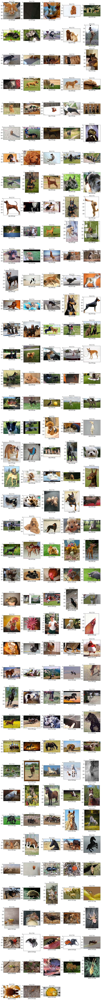

In [67]:
fig = plt.figure(figsize=(17, 180))
# setting values to rows and column variables
rows = 41
columns = 5
i_img = 1
for ind in l_dif:
    fig.add_subplot(rows, columns, i_img)
    i_img +=1
    plt.imshow(cv2.imread(imgnames[ind])[:, :, ::-1])
    #plt.yticks([])
    plt.xticks([])
    plt.xlabel(df['name_img'].iloc[ind])
    plt.title("R:{} | T:{}".format(out_img[ind], targets[ind]))

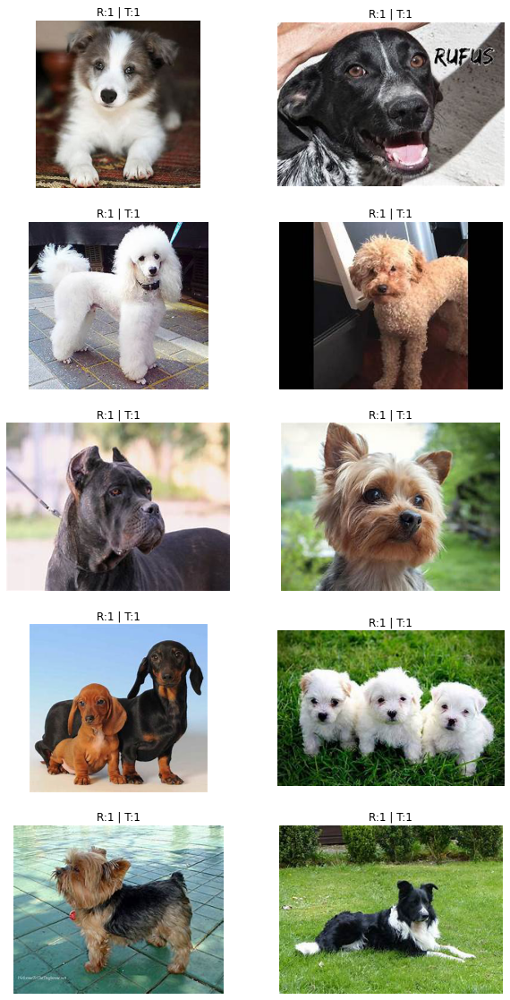

In [16]:
fig = plt.figure(figsize=(10, 20))
# setting values to rows and column variables
rows = 5
columns = 2
num_img = 10
for i in range(num_img):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(cv2.imread(imgnames[i+1000])[:, :, ::-1])
    plt.axis('off')
    plt.title("R:{} | T:{}".format(outputs2_lm[i], targets[i+1000]))

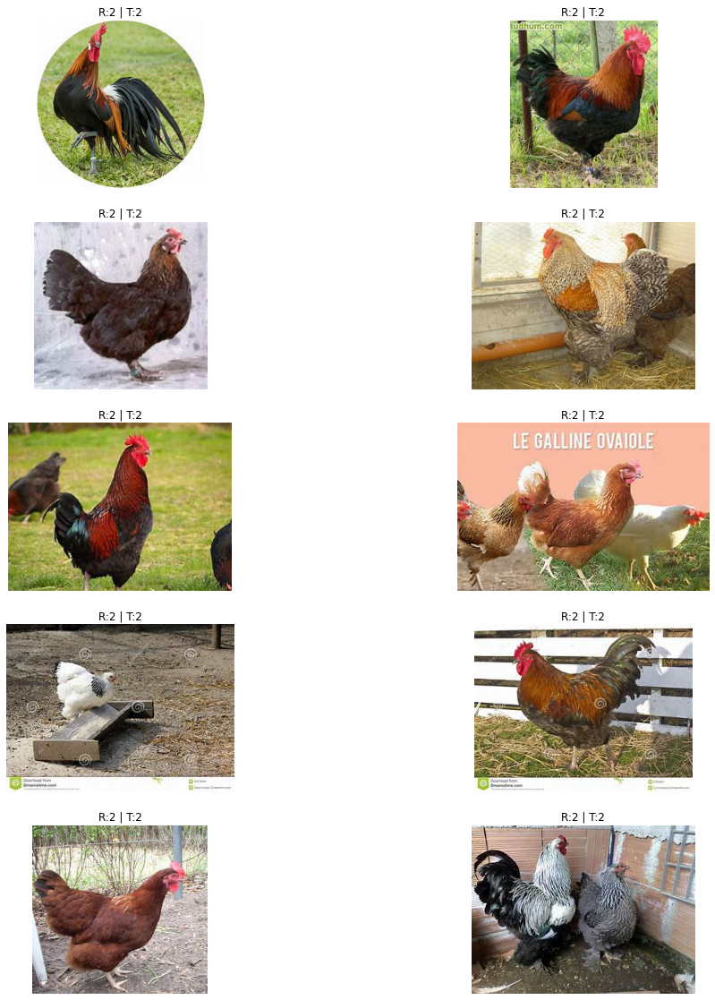

In [17]:
fig = plt.figure(figsize=(17, 20))
# setting values to rows and column variables
rows = 5
columns = 2
num_img = 10 #Num de imagenes que se imprimiran
for i in range(num_img):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(cv2.imread(imgnames[i+2000])[:, :, ::-1])
    plt.axis('off')
    plt.title("R:{} | T:{}".format(outputs3_lm[i], targets[i+2000]))

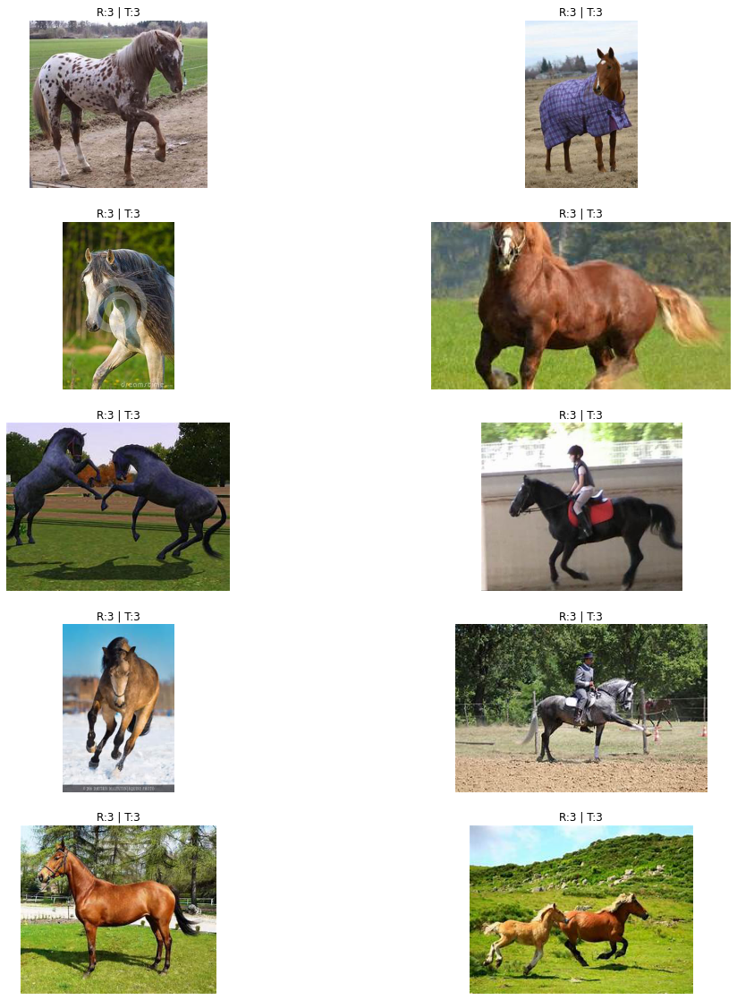

In [20]:
fig = plt.figure(figsize=(17, 20))
# setting values to rows and column variables
rows = 5
columns = 2
num_img = 10 #Num de imagenes que se imprimiran
for i in range(num_img):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(cv2.imread(imgnames[i+3000])[:, :, ::-1])
    plt.axis('off')
    plt.title("R:{} | T:{}".format(outputs4_lm[i], targets[i+3000]))

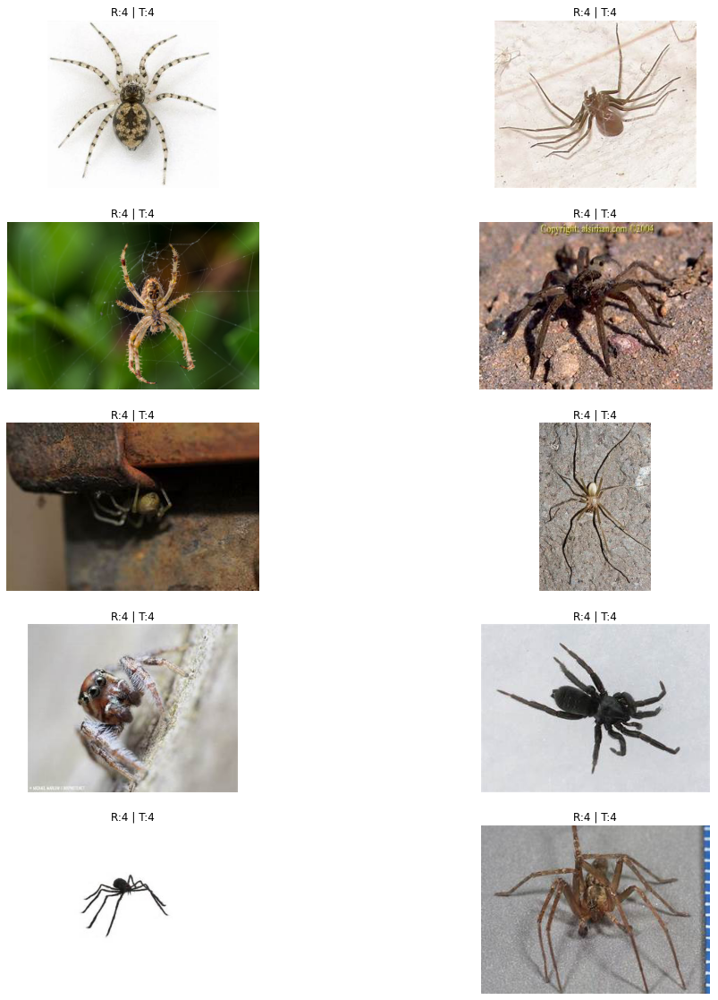

In [21]:
fig = plt.figure(figsize=(17, 20))
# setting values to rows and column variables
rows = 5
columns = 2
num_img = 10 #Num de imagenes que se imprimiran
for i in range(num_img):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(cv2.imread(imgnames[i+4000])[:, :, ::-1])
    plt.axis('off')
    plt.title("R:{} | T:{}".format(outputs5_lm[i], targets[i+4000]))